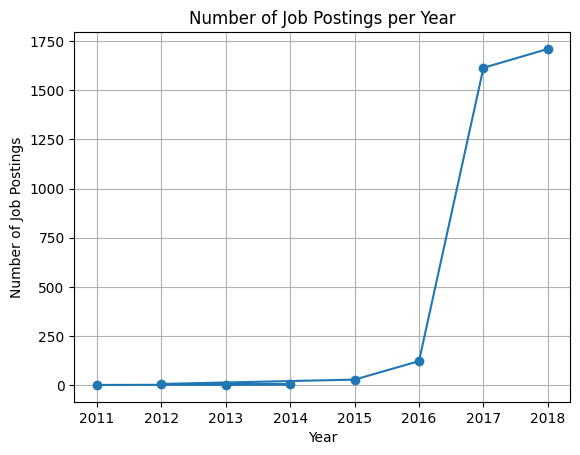

2018 1710
2017 1614
2016 123
2015 29
2012 7
2014 5
2013 3
2011 2


In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset using a raw string
# C:\Users\5530\OneDrive\Desktop\Study_Material\Data_Analytics\Data-Analytics\Amazon_Data\AWS.csv
amazon = pd.read_csv('C:/Users/5530/OneDrive/Desktop/Study_Material/Data_Analytics/Data-Analytics/Amazon_Data/AWS.csv', encoding='utf-8', encoding_errors='ignore')

# Extract the year from the posting date
amazon['Year'] = pd.to_datetime(amazon['Posting_date']).dt.year

# Count the number of job postings for each year
job_postings_per_year = amazon['Year'].value_counts()

# Sort the years in ascending order
sorted_job_postings = job_postings_per_year.sort_values(ascending=False)

# Plot the line graph
plt.plot(sorted_job_postings.index, sorted_job_postings.values, marker='o')
plt.title('Number of Job Postings per Year')
plt.xlabel('Year')
plt.ylabel('Number of Job Postings')
plt.grid()
plt.show()

# Print the year and number of job postings
for year, count in sorted_job_postings.items():
    print(f'{year} {count}')


In [12]:
import matplotlib.pyplot as plt
import pandas as pd

amazon = pd.read_csv('C:/Users/5530/OneDrive/Desktop/Study_Material/Data_Analytics/Data-Analytics/Amazon_Data/AWS.csv', encoding='utf-8', encoding_errors='ignore')

aws = amazon.copy()
aws['Title'] = aws[aws['Title'].str.contains('Software developer', case=False, na=False)].any()
J=aws['Title'].value_counts()
print(J)

Series([], Name: count, dtype: int64)


In [13]:
import csv
import numpy as np


with open('C:/Users/5530/OneDrive/Desktop/Study_Material/Data_Analytics/Data-Analytics/Amazon_Data/AWS.csv' ,'r', encoding='utf-8',errors='ignore',newline='') as file_obj:
    file_data = csv.DictReader(file_obj, skipinitialspace=True, delimiter=',')
    my_file = list(file_data)
    print(my_file)

[{'S.No.': '0', 'Title': 'Software Development Manager', 'location': 'US, WA, Seattle ', 'Posting_date': 'March 1, 2018', 'DESCRIPTION': 'You are an experienced hands-on manager with a background in developing and delivering software that simplifies solutions for a broad set of related problems. You have a strong technical ability, great communication skills, and know how to inspire your team to achieve outstanding results in a fast paced environment. You have a track record of building and leading strong teams of talented engineers and you enjoy working with smart people. In short - you are a skilled leader capable of getting great things done for your customers. If it sounds like you - then read on!As one of the largest companies in the cloud computing space across the world, Amazon Web Services (AWS) offers dozens of services and processes billions of usage records. Over the past 10 years, Amazon has become known across the globe as the most trusted company on the internet.The syste

In [14]:
# Task1:- To print the S.no of the title 
t=[]
for ele in my_file:
    t.append(ele['Title'])
for i,j in enumerate(t[:50],start=40):
    print(i,j)
print()


40 Software Development Manager
41 Software Development Engineer
42 Software Development Engineer
43 Software Development Engineer - Amazon Lex
44 Software Development Engineer - Amazon Lex
45 Software Development Engineer - Amazon Lex
46 Quality Assurance Engineer
47 Software Development Engineer
48 Software Development Engineer
49 Software Development Manager - Amazon Cloud Cam
50 Software Development Engineer  Alexa Machine Learning Platform
51 Manager of Application Development and Engineering
52 Programmer Analyst
53 Senior Applied Robotics Scientist
54 DevOps Engineer
55 UI Developer
56 Sr. Software Development Engineer, AWS Lex
57 SDE
58 Software Engineer- Mobile Analytics, AWS Pinpoint
59 Software Engineer- Big Data Analytics, AWS Pinpoint
60 Software Engineer- Big Data Analytics, AWS Pinpoint
61 Software Engineer- Big Data Analytics, AWS Pinpoint
62 Software Engineer, Big Data and Analytics
63 Software Development Engineer - Amazon Prime Video
64 Software Development Engineer 

In [15]:
# Task2:- To get the Title that works as software developers

count=0 
for j in t[:31]:  #To prt till 30 S.no
    if 'Software Development' in j :
        count+=1
print(count) #Print the count of 'Software developers'

19


In [16]:
# Task3:- To get the location of all India Work stations (Bangalore and KA)
s=[] 
for j in my_file:
    s.append(j['location'])
k=0
p=0
for loc in s:
    country = [part.strip() for part in loc.split(',')] 
    # print(country)
    # for ele in country[1:3]:
    #     print(ele)
    if 'Bangalore' in country:
        k+=1
    if 'KA' in country:
        p+=1
print(k,p)

66 66


In [24]:
# Task 4:- No of Jobs in various American City 

jobs =[]
citys =[]
for ele in my_file:
    jobs.append(ele['location'])
k={}
for loc in jobs:
    jobs_split_form = [part.strip() for part in loc.split(',') ]
    if 'US'in jobs_split_form:
        if len(jobs_split_form)>=3:
            cis=jobs_split_form[2]
            citys.append(cis)
            # print(citys)
            for i in citys:
                if i in k:
                    k[i]+=1
                else:
                    k[i]=1

#Way1: Better way(optimized Way to print the key and it value)

max_values= max(k,key=k.get)
print(f"(WAY 1): City with the highest number of jobs in the city {max_values} with jobs: {k[max_values]}")

#Way2: To find it with loop method

max_count=0
max_na=''
for ele in k:
    if k[ele] > max_count:
        max_count=k[ele]
        max_na =ele
# Print the city and its count
print(f"(WAY 2): City with the highest number of jobs in the city {max_na} with jobs: {max_count}")

(WAY 1): City with the highest number of jobs in the city Seattle with jobs: 2657260
(WAY 2): City with the highest number of jobs in the city Seattle with jobs: 2657260


In [27]:
# Task 5:- Just to split the location acccording to the city,State,Country form 
# the location column (using numpy lib.)

jobs = []  # List to store job locations
countries = []  # List to store countries
states = []  # List to store states
cities = []  # List to store cities

# Populate the jobs list from my_file (assumed to be your dataset)
for ele in my_file:
    jobs.append(ele['location'])

# Loop through each job location
for loc in jobs:
    # Split the location by commas and strip extra spaces
    jobs_split_form = [part.strip() for part in loc.split(',')]
    jobs_split_form = np.array(jobs_split_form)  # Convert to NumPy array
    
    # Proceed only if there are at least 3 parts (country, state, city)
    if len(jobs_split_form) >= 3:
        country = jobs_split_form[0]  # First element is the country
        state = jobs_split_form[1]    # Second element is the state
        city = jobs_split_form[2]     # Third element is the city

        # Append the country, state, and city to their respective lists
        countries.append(country)
        states.append(state)
        cities.append(city)
    else:
        # Handle cases with missing parts (optional)
        print(f"Invalid location format: {jobs_split_form}")

# Now you have separate lists for countries, states, and cities
print("Countries:", countries)
print("States:", states)
print("Cities:", cities)

Invalid location format: ['RO' 'Ia?i']
Invalid location format: ['RO' 'Iasi']
Invalid location format: ['PL' 'Gdansk']
Invalid location format: ['PL' 'Gdansk']
Invalid location format: ['PL' 'Bielany Wroclawskie']
Invalid location format: ['PL' 'Gdansk']
Invalid location format: ['DE' 'Berlin']
Invalid location format: ['PL' 'Gdansk']
Invalid location format: ['PL' 'Gdansk']
Invalid location format: ['AE' 'Dubai']
Invalid location format: ['RO' 'Iasi']
Invalid location format: ['RO' 'Iasi']
Invalid location format: ['ES' 'Madrid']
Invalid location format: ['IT' 'Vercelli']
Invalid location format: ['ES' 'Madrid']
Invalid location format: ['IL' 'Herzliya']
Invalid location format: ['DE' 'Aachen']
Invalid location format: ['DE' 'Berlin']
Invalid location format: ['DE' 'Berlin']
Invalid location format: ['UK' 'London']
Invalid location format: ['UK' 'London']
Invalid location format: ['UK' 'London']
Invalid location format: ['ZA' 'Cape Town']
Invalid location format: ['DE' 'Berlin']
Inval

In [19]:
#Task 6:- No of Bachlor Jobs and Master Job in all the country and
#which degree job is more in that country

country = []    # List to store countries
Basic_eq = []   # List to store basic qualifications

# Populate country and basic qualifications lists
for ele in my_file:
    country.append(ele['location'])  # Country location
    Basic_eq.append(ele['BASIC QUALIFICATIONS'])  # Job qualifications

# Create dictionaries to store Bachelor's and Master's job counts per country
bachelor_count = {}
master_count = {}

# Loop through each qualification and count Bachelor's and Master's jobs for each country
for i in range(len(Basic_eq)):
    # Clean up country names
    loc_parts = [part.strip() for part in country[i].split(',')]
    
    if len(loc_parts) > 0:
        country_name = loc_parts[0]
    else:
        country_name = "Unknown"  # In case of missing country

    # Check for 'Bachelor' in qualifications
    if 'Bachelor' in Basic_eq[i]:
        if country_name in bachelor_count:
            bachelor_count[country_name] += 1
        else:
            bachelor_count[country_name] = 1

    # Check for 'Master' in qualifications
    if 'Master' in Basic_eq[i]:
        if country_name in master_count:
            master_count[country_name] += 1
        else:
            master_count[country_name] = 1

# Compare Bachelor's and Master's jobs for each country
for country_name in bachelor_count.keys():
    bachelor_jobs = bachelor_count.get(country_name, 0)
    master_jobs = master_count.get(country_name, 0)
    
    if bachelor_jobs > master_jobs:
        print(f"{country_name} has more Bachelor's jobs: {bachelor_jobs} vs {master_jobs}")
    else:
        print(f"{country_name} has more Master's jobs: {master_jobs} vs {bachelor_jobs}")

US has more Bachelor's jobs: 1906 vs 302
IN has more Bachelor's jobs: 98 vs 32
RO has more Bachelor's jobs: 4 vs 2
CA has more Bachelor's jobs: 115 vs 31
DE has more Bachelor's jobs: 19 vs 2
ES has more Bachelor's jobs: 13 vs 1
IL has more Bachelor's jobs: 4 vs 0
UK has more Bachelor's jobs: 28 vs 4
SG has more Bachelor's jobs: 3 vs 0
AU has more Bachelor's jobs: 5 vs 0
PL has more Bachelor's jobs: 7 vs 1
IE has more Bachelor's jobs: 27 vs 3
BR has more Bachelor's jobs: 8 vs 0
CN has more Bachelor's jobs: 10 vs 1
NL has more Master's jobs: 1 vs 1
ZA has more Bachelor's jobs: 4 vs 0
IT has more Bachelor's jobs: 1 vs 0
JO has more Bachelor's jobs: 2 vs 0
TW has more Bachelor's jobs: 3 vs 0
JP has more Bachelor's jobs: 1 vs 0
LU has more Bachelor's jobs: 3 vs 2
 has more Bachelor's jobs: 1 vs 0
